In [1]:
# import numpy as np

# # !/usr/bin/env python3
# # -*- coding: utf-8 -*-
# """
# Created on 20181219

# @author: zhangji

# Trajection of a ellipse, Jeffery equation. 
# """

# %pylab inline
# pylab.rcParams['figure.figsize'] = (25, 11)
# fontsize = 40

# import numpy as np
# import scipy as sp
# from scipy.optimize import leastsq, curve_fit
# from scipy import interpolate
# from scipy.interpolate import interp1d
# from scipy.io import loadmat, savemat
# # import scipy.misc

# import matplotlib
# from matplotlib import pyplot as plt
# from matplotlib import animation, rc
# import matplotlib.ticker as mtick
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
# from mpl_toolkits.mplot3d import Axes3D, axes3d

# from sympy import symbols, simplify, series, exp
# from sympy.matrices import Matrix
# from sympy.solvers import solve

# from IPython.display import display, HTML
# from tqdm import tqdm_notebook as tqdm
# import pandas as pd
# import re
# from scanf import scanf
# import os
# import glob

# from codeStore import support_fun as spf
# from src.support_class import *
# from src import stokes_flow as sf

# rc('animation', html='html5')
# PWD = os.getcwd()
# font = {'size': 20}
# matplotlib.rc('font', **font)
# np.set_printoptions(linewidth=90, precision=5)

%load_ext autoreload
%autoreload 2

import os
import glob
import natsort 
import numpy as np
import scipy as sp
from scipy.optimize import leastsq, curve_fit
from scipy import interpolate, integrate
from scipy import spatial, signal
# from scipy.interpolate import interp1d
from scipy.io import loadmat, savemat
# import scipy.misc
# import importlib
from IPython.display import display, HTML
import pandas as pd
import pickle
import re
from scanf import scanf

import matplotlib
# matplotlib.use('agg')
from matplotlib import pyplot as plt
import matplotlib.colors as colors
from matplotlib import animation, rc
import matplotlib.ticker as mtick
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
from mpl_toolkits.mplot3d import Axes3D, axes3d
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from mpl_toolkits.mplot3d.art3d import Line3DCollection
from matplotlib import cm

from tqdm.notebook import tqdm as tqdm_notebook
from tqdm import tqdm
from time import time
from src.support_class import *
from src import jeffery_model as jm
from codeStore import support_fun as spf
from codeStore import support_fun_table as spf_tb

# %matplotlib notebook
%matplotlib inline
rc('animation', html='html5')
fontsize = 40
PWD = os.getcwd()

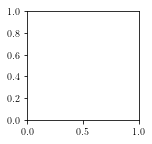

In [2]:
fig = plt.figure(figsize=(2, 2))
fig.patch.set_facecolor('white')
ax0 = fig.add_subplot(1, 1, 1)

In [3]:
job_dir = 'ecoC01B05_wt0.1_psi-0a'
table_name = 'ecoC01B05_tao1_wm0.1'
t_headle = '(.*?).pickle'

In [4]:
t_dir = os.path.join(PWD, job_dir)

data = spf_tb.load_table_data_pickle_dir(t_dir, t_headle)
lst_eta = data.lst_eta
theta_max_fre = data.theta_max_fre
phi_max_fre = data.phi_max_fre
psi_max_fre = data.psi_max_fre
eta_max_fre = data.eta_max_fre
data_idx = data.data_idx.fillna(-1).astype(int)

In [13]:
# sort all frequrents
with np.printoptions(precision=10, suppress=True, threshold=1e10):
    print(np.flipud(np.sort(data.theta_max_fre.values.flatten())))

[0.068254267  0.0586605145 0.0206826103 0.0206797877 0.0206625628
 0.0206536615 0.0206417512 0.0206393922 0.0206219575 0.0206198636
 0.0206124589 0.0206093356 0.0206058682 0.0205954394 0.0205927342
 0.0205905679 0.0205809703 0.02057499   0.0205729064 0.0205595241
 0.0205586433 0.0205533853 0.0205480273 0.0205359495 0.0205337571
 0.0205336987 0.0205332124 0.0205232614 0.0205208279 0.0205145767
 0.0205113985 0.0205103503 0.0205097386 0.0205087672 0.0205078573
 0.0205051652 0.020503653  0.0204994398 0.0204990942 0.0204990712
 0.0204990296 0.0204936705 0.0204902889 0.020490214  0.0204798011
 0.0204792385 0.0204738972 0.0204695026 0.0204677492 0.0204657886
 0.0204649897 0.0204626234 0.0204549791 0.0204528295 0.0204476276
 0.0204472433 0.0204445706 0.0204443395 0.0204439012 0.0204436152
 0.0204418228 0.0204416308 0.0204404514 0.0204362001 0.020435965
 0.0204333201 0.0204319713 0.0204273595 0.020421091  0.0204201072
 0.0204190146 0.0204189978 0.0204186863 0.0204183902 0.0204116977
 0.02040839

1 346
2 2



5.0 527


True

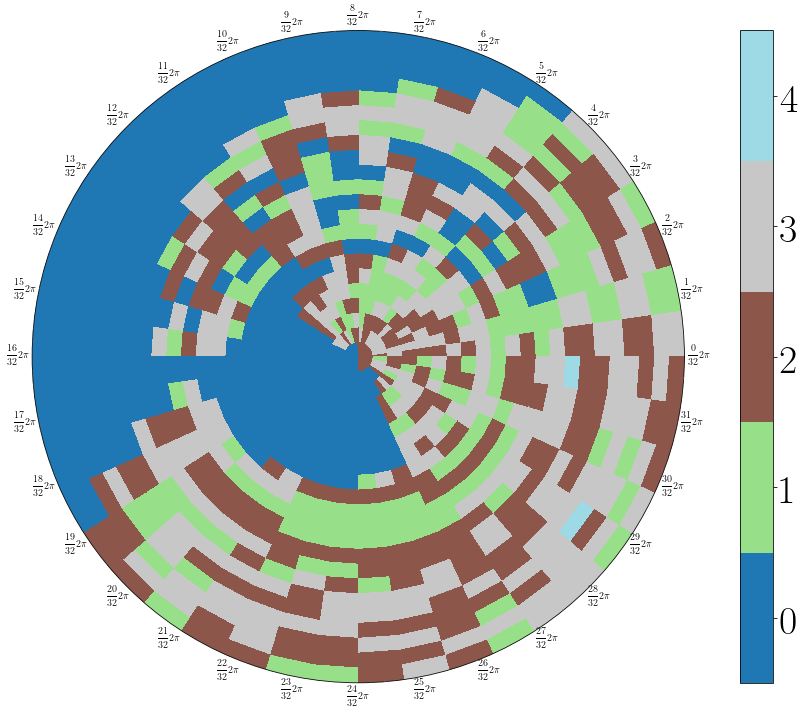

In [45]:
# put images with same frequence into a subdirect
check_fre_list = [0.0160, 0.0170, 0.0190]
atol_fre_list =  [0.0002, 0.0002, 0.0002]
Table_t_range = np.array((4500, np.inf))

def sub_seperate_0(i1, type_fre, iidx, Table_t_range):
    t1 = np.zeros_like(iidx[0])
    return t1

def sub_seperate_2(i1, type_fre, iidx, Table_t_range):
    theta = type_fre.index.values[iidx[0]]
    phi = type_fre.columns.values[iidx[1]]
    theta_phi_list = np.vstack((theta, phi)).T
    tuse = []
    for theta, phi in tqdm_notebook(theta_phi_list, desc='No. %d  ' % i1):
        tpick, _ = spf_tb.load_table_date_pickle(job_dir, theta, phi)
        Table_t = tpick['Table_t']
        Table_theta = tpick['Table_theta']
        Table_phi = tpick['Table_phi']
        Table_psi = tpick['Table_psi']
        
        idx = np.logical_and(Table_t >= Table_t_range[0], Table_t <= Table_t_range[1])
        tuse.append(np.max(Table_theta[idx]))
    tuse = np.hstack(tuse)
    t1 = np.ones_like(tuse)
    t1[tuse >1.9] = 0
    t1[tuse < 1.844] = 2
    return t1

# def sub_seperate_2(i1, type_fre, iidx, Table_t_range):
#     theta = type_fre.index.values[iidx[0]]
#     phi = type_fre.columns.values[iidx[1]]
#     theta_phi_list = np.vstack((theta, phi)).T
#     tuse = []
#     for theta, phi in tqdm_notebook(theta_phi_list, desc='No. %d  ' % i1):
#         tpick, _ = spf_tb.load_table_date_pickle(job_dir, theta, phi)
#         Table_t = tpick['Table_t']
#         Table_theta = tpick['Table_theta']
#         Table_phi = tpick['Table_phi']
#         Table_psi = tpick['Table_psi']
        
#         idx = np.logical_and(Table_t >= Table_t_range[0], Table_t <= Table_t_range[1])
#         tuse.append(np.max(Table_phi[idx]))
#     tuse = np.hstack(tuse)
#     t1 = np.ones_like(tuse)
#     t1[tuse < 4] = 0
#     t1[tuse > 5.1] = 2
#     return t1
    
sub_seperate = {0: sub_seperate_0, 
                1: sub_seperate_0, 
                2: sub_seperate_2, 
                3: sub_seperate_0, }

tfre = theta_max_fre.copy()
type_fre = tfre.copy()
type_fre.iloc[:, :] = -1
i0 = 0
process_total = 0
for i1, (check_fre, atol_fre) in enumerate(zip(check_fre_list[:], atol_fre_list)):
    use_idx = np.isclose(tfre, check_fre, rtol=0, atol=atol_fre)
    iidx = np.where(use_idx)
    process_total = process_total + np.sum(use_idx)
    t1 = sub_seperate[i1](i1, type_fre, iidx, Table_t_range)
    type_fre.iloc[use_idx] = i0 + t1
    i0 = i0 + 1 + np.max(t1)
    print(i0, np.sum(use_idx))

# plot one of the remaind cases
if np.any(type_fre.values == -1):
    for i3, i4 in np.vstack(np.where(type_fre.values == -1)).T:
        type_fre.iloc[i3].iloc[i4] = i0

assert np.all(type_fre.values >= 0)
type_fre2 = type_fre.copy()
type_fre2.iloc[type_fre.values == 0] = 0
type_fre2.iloc[type_fre.values == 1] = 4
type_fre2.iloc[type_fre.values == 2] = 3
type_fre2.iloc[type_fre.values == 3] = 3
type_fre2.iloc[type_fre.values == 4] = 2
type_fre2.iloc[type_fre.values == 5] = 1
spf_tb.show_traj_phase_map_type(type_fre2)
# spf_tb.save_separate_angleList_fft(job_dir, tfre, check_fre_list, atol_fre_list)

In [55]:
t1 = []
for i0 in np.arange(type_fre2.values.max() + 1):
    t1.append(np.isclose(type_fre2.values, i0).sum())

print(np.sum(t1))
print(t1)
print(t1 / np.sum(t1))

1035
[346, 160, 265, 262, 2]
[0.33429952 0.15458937 0.25603865 0.2531401  0.00193237]


-ini_theta 0.000000 -ini_phi 1.714000
-ini_theta 0.000000 -ini_phi 0.000000 -ini_psi 3.141593


/anaconda3/envs/py35/lib/python3.5/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


-ini_theta 0.143000 -ini_phi 1.856000
-ini_theta 0.142800 -ini_phi 1.856396 -ini_psi 0.000000
-ini_theta 0.000000 -ini_phi 0.000000
-ini_theta 0.000000 -ini_phi 0.000000 -ini_psi 0.000000
-ini_theta 0.143000 -ini_phi 0.143000
-ini_theta 0.142800 -ini_phi 0.142800 -ini_psi 0.000000
-ini_theta 1.999000 -ini_phi 6.140000
-ini_theta 1.999195 -ini_phi 6.140386 -ini_psi 0.000000


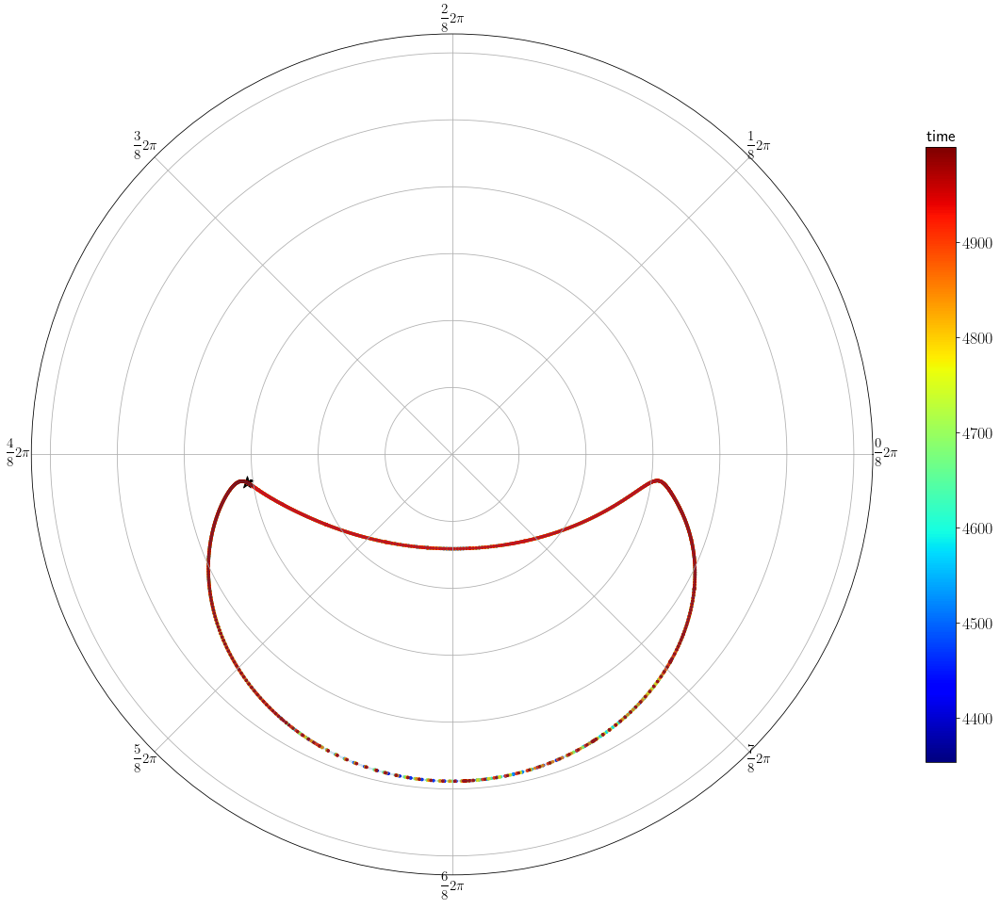

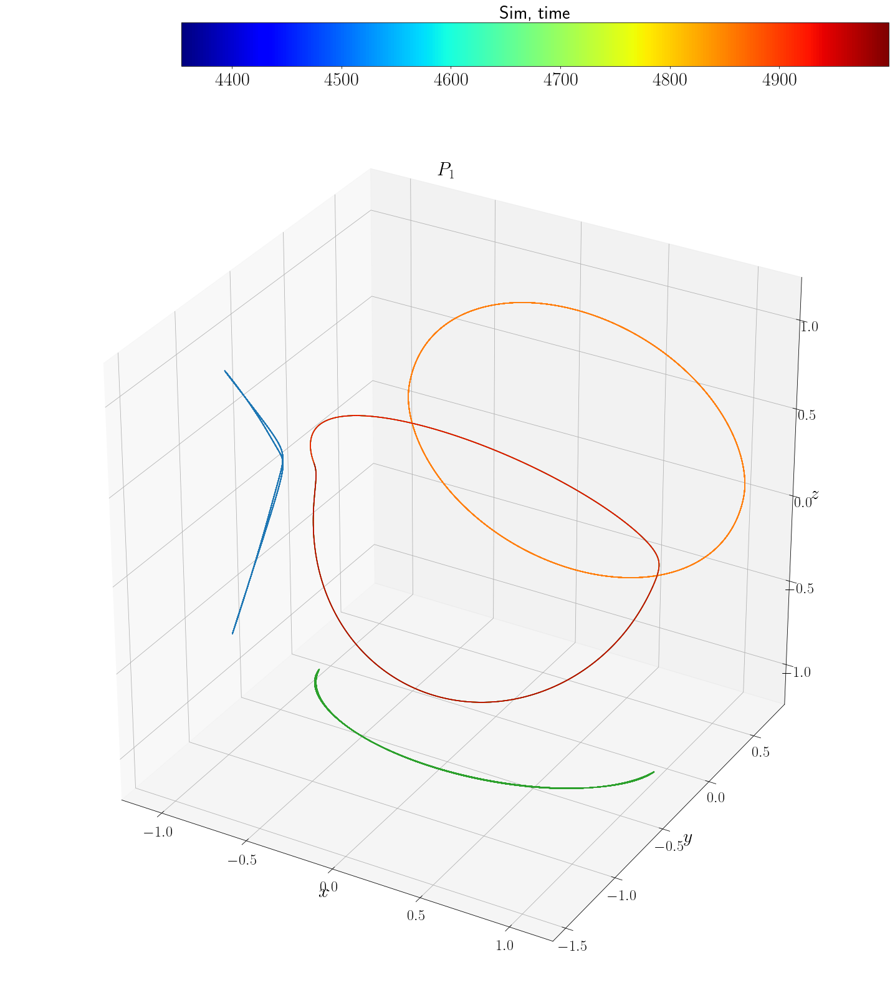

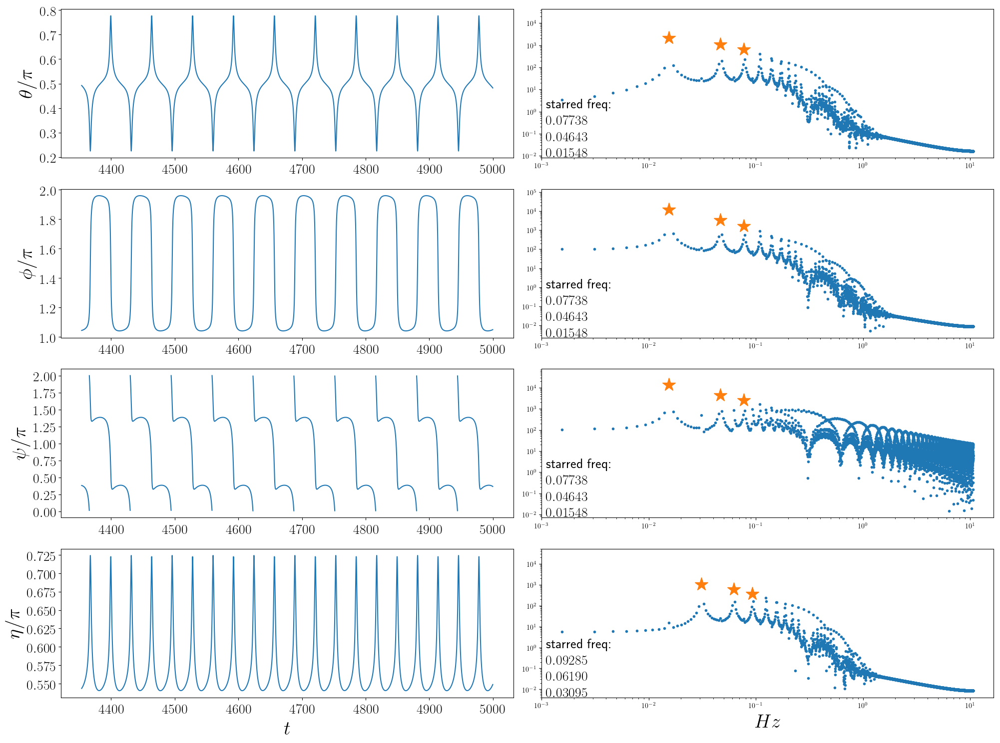

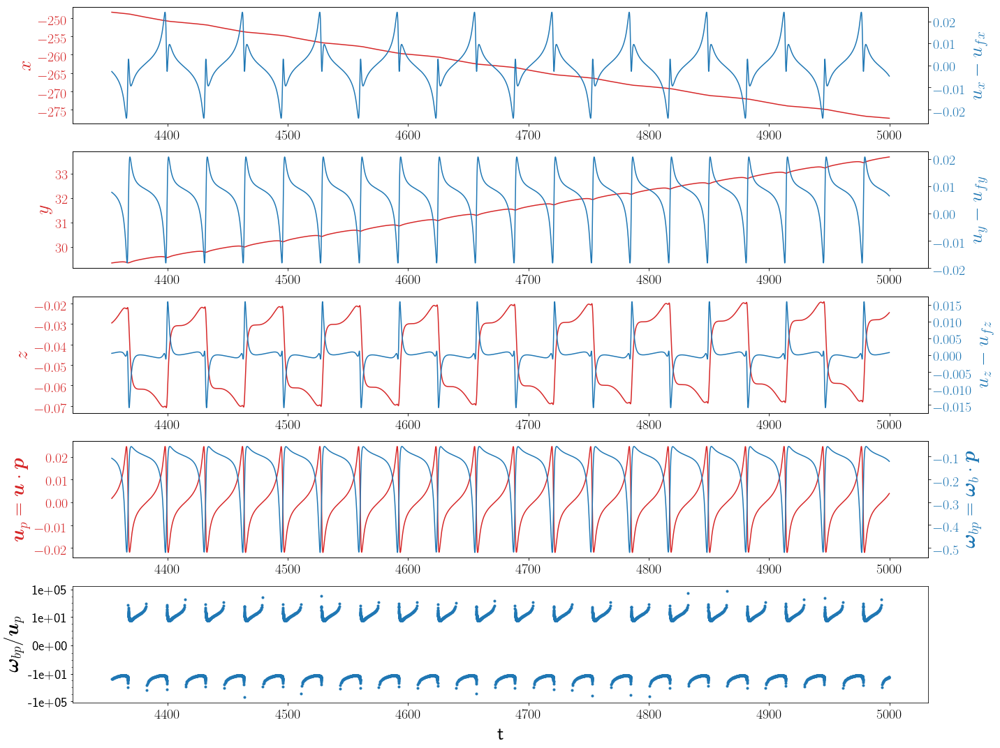

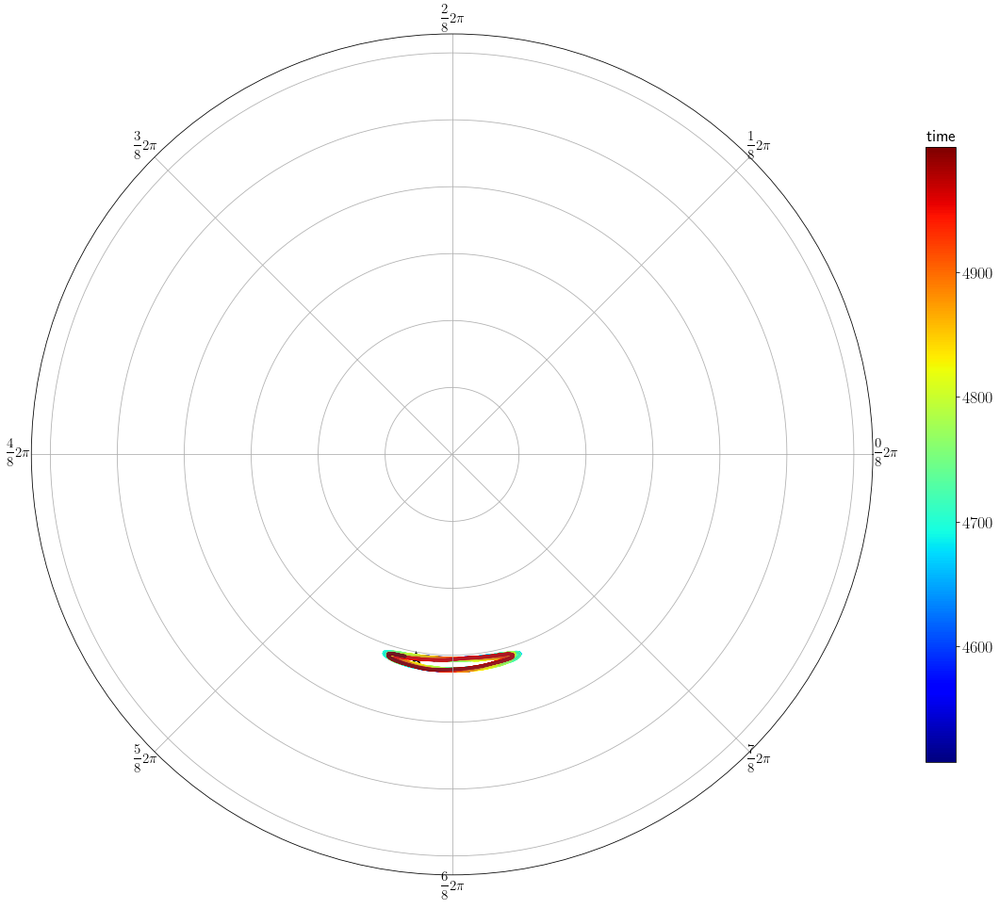

...

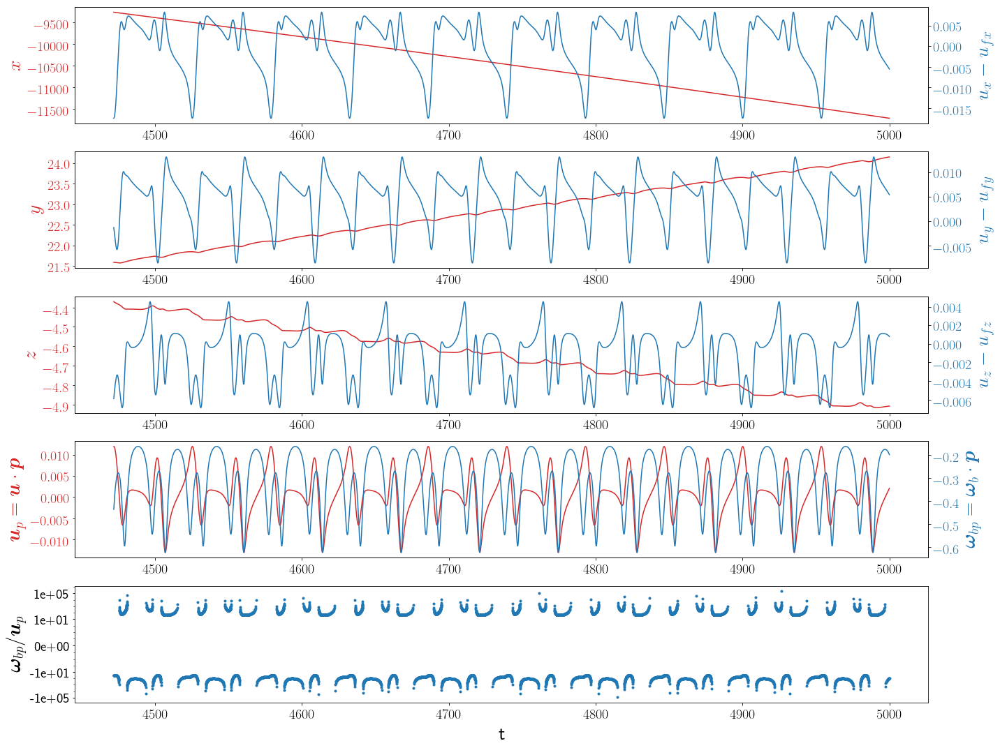

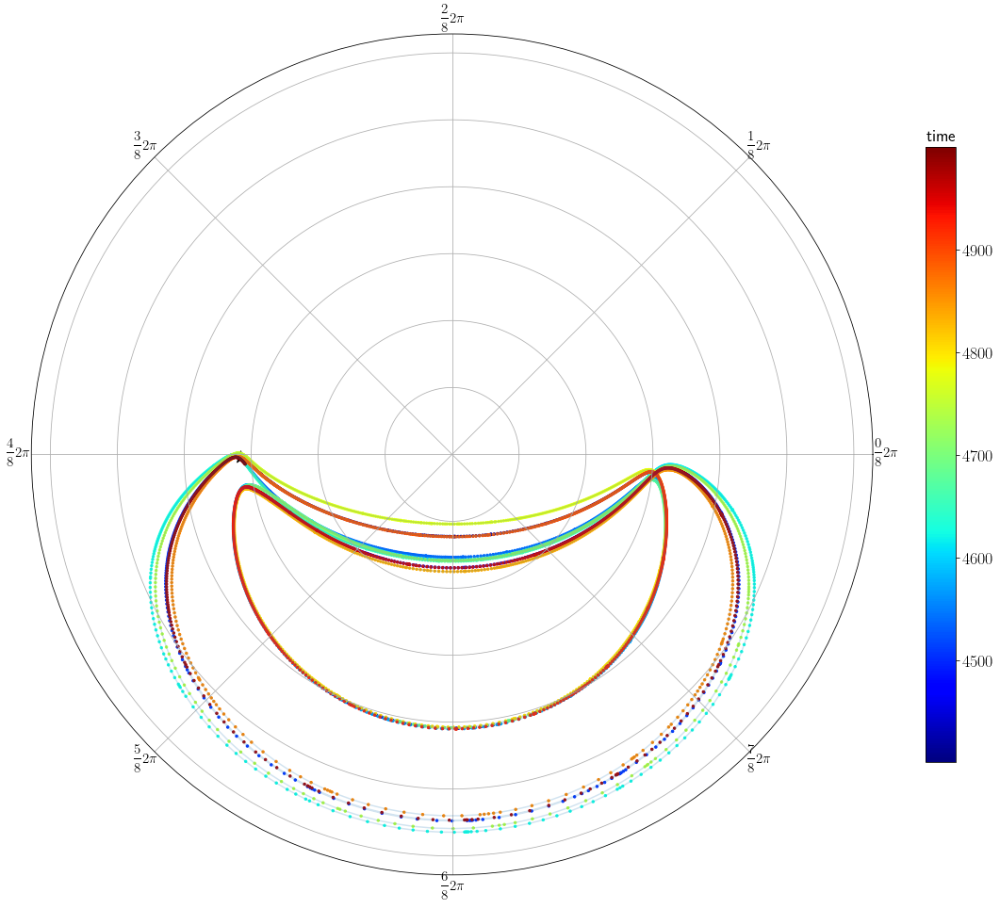

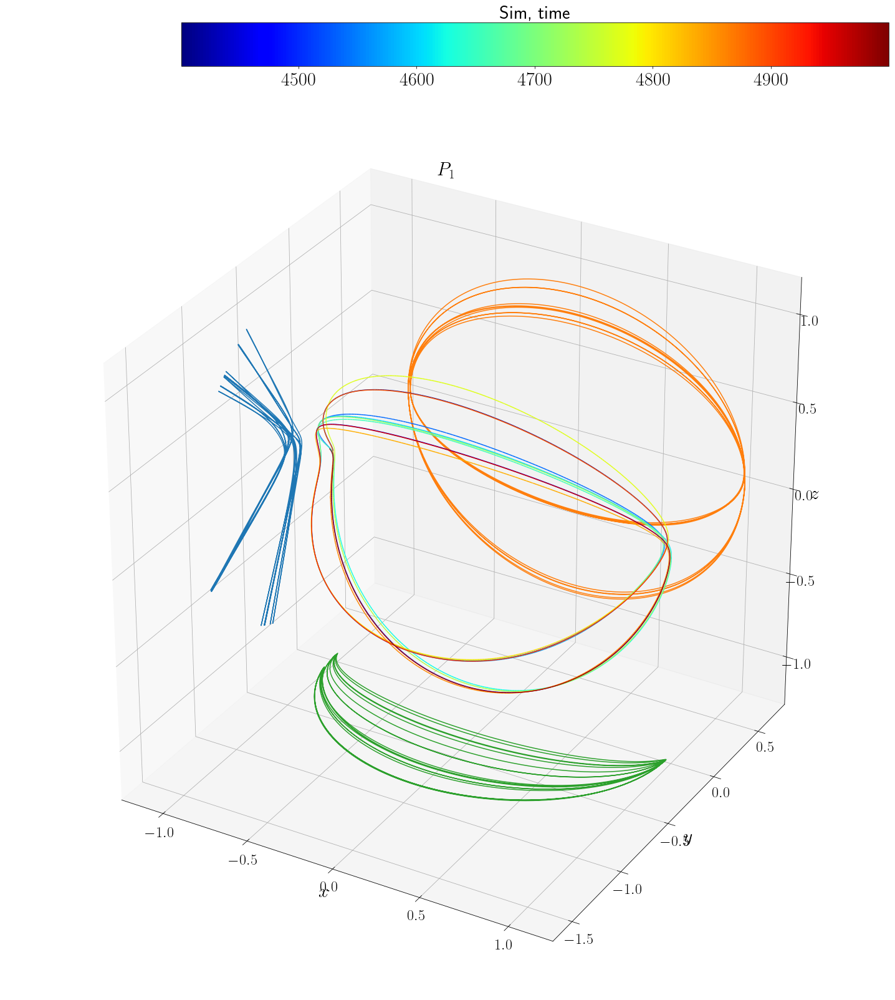

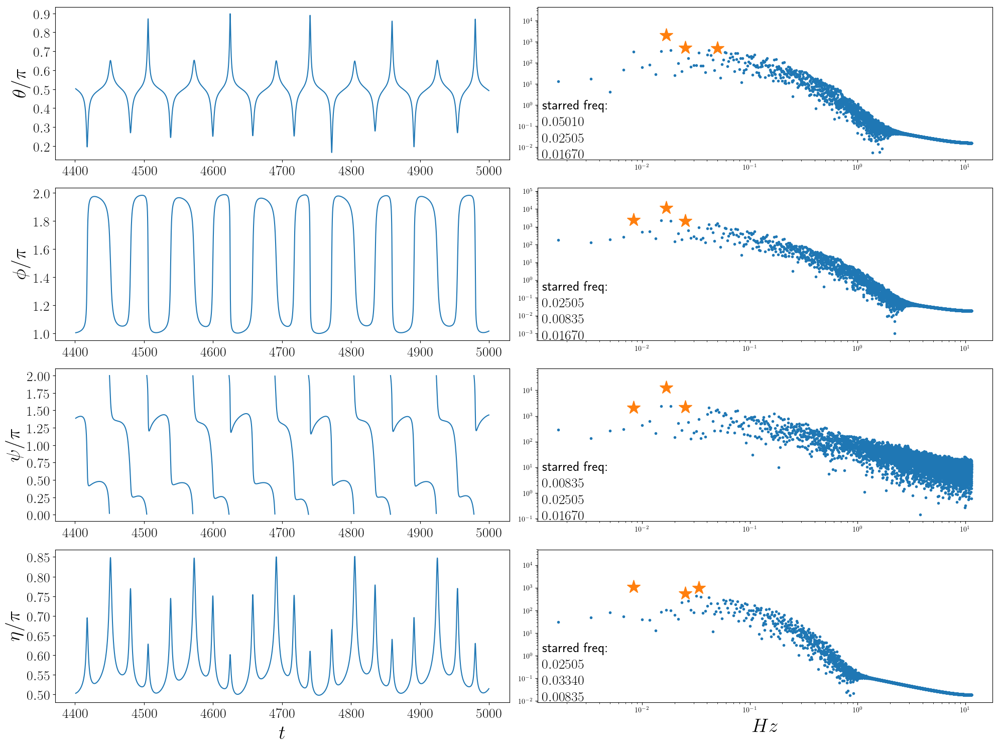

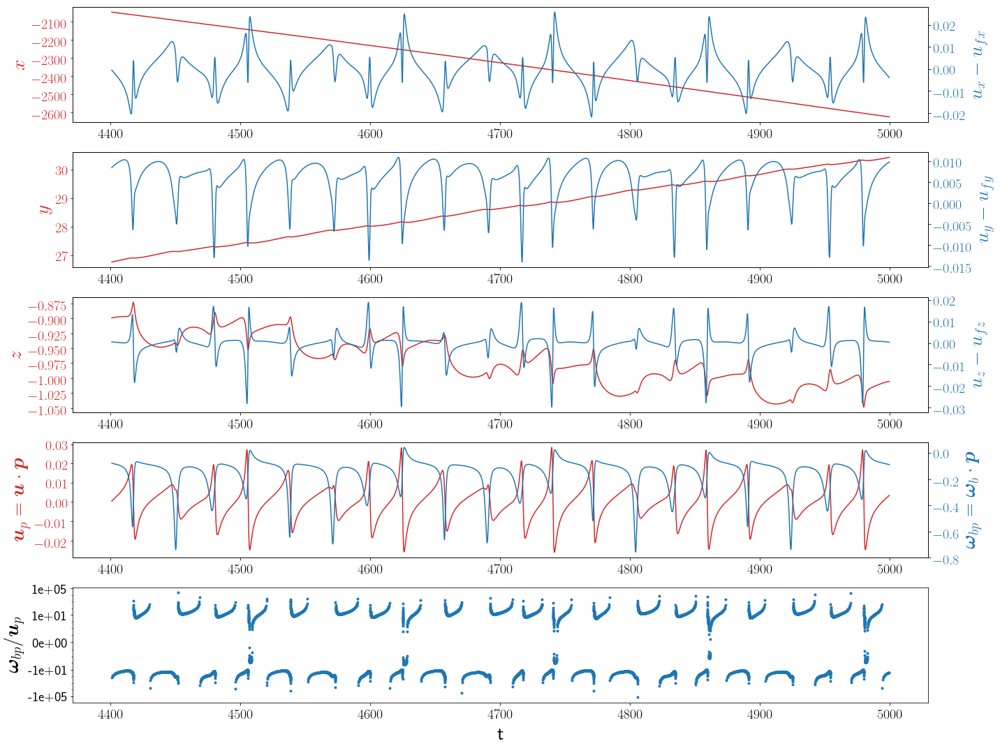

In [56]:
fast_mode1 = 0
figsize = np.array((16, 9)) * 0.5
dpi = 200

tipical_th_ph_list = []
for i0 in np.arange(type_fre2.values.max() + 1)[:]:
    iidx = np.where(np.isclose(type_fre2.values, i0))
    spf_tb.phase_map_show_idx(type_fre2, tipical_th_ph_list, iidx, job_dir, table_name, fast_mode=fast_mode1, )

True

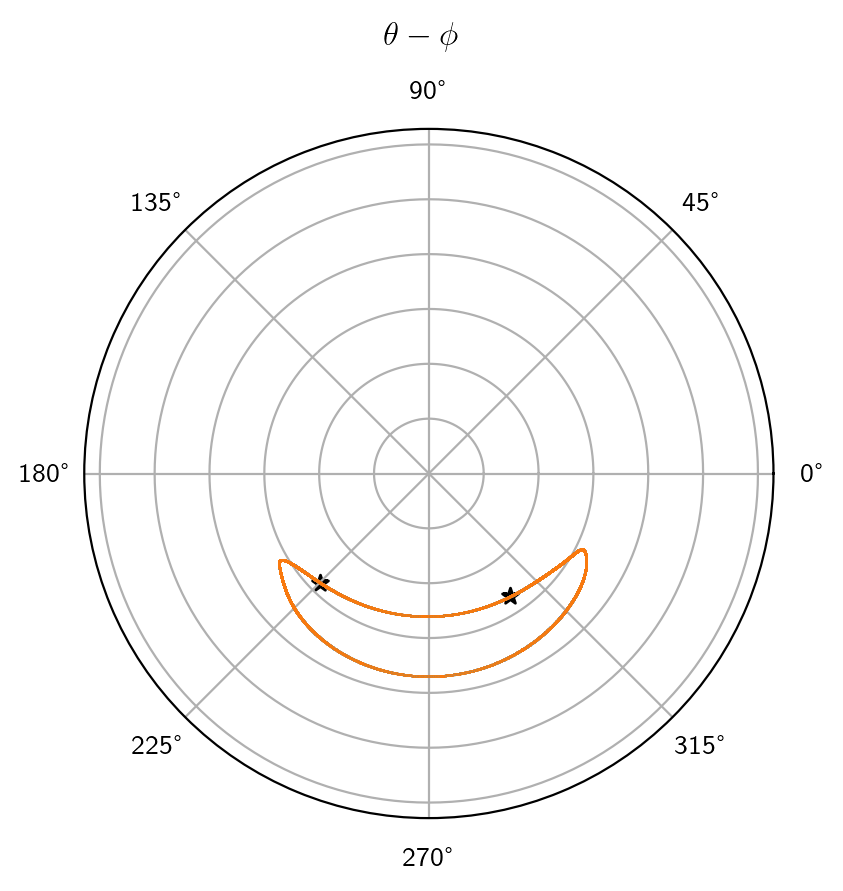

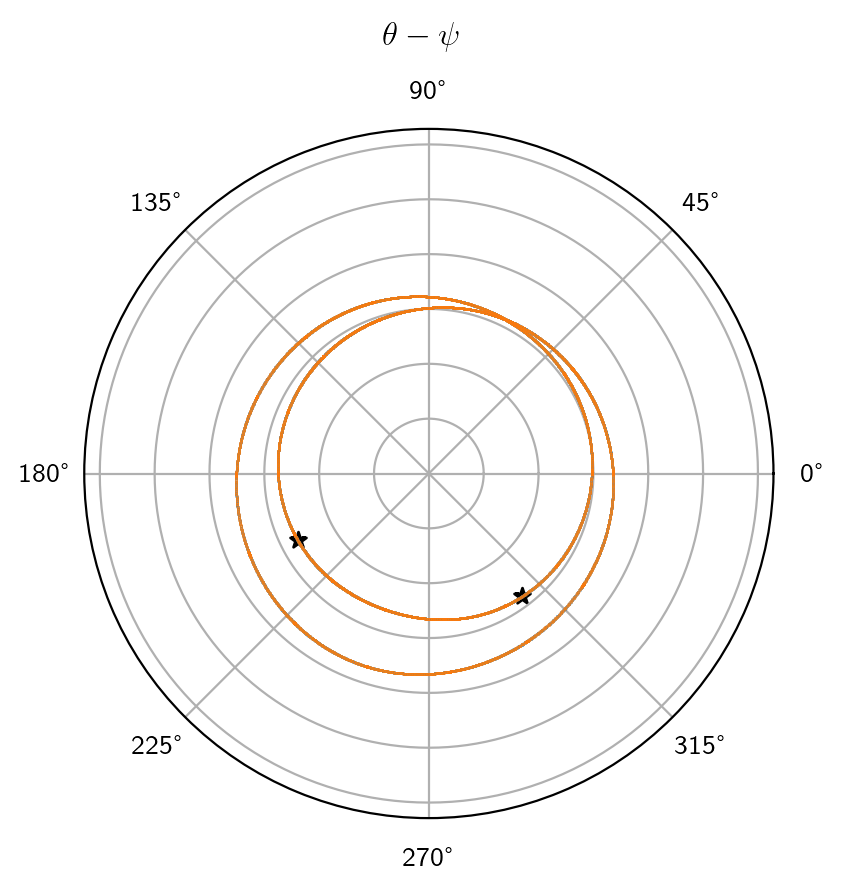

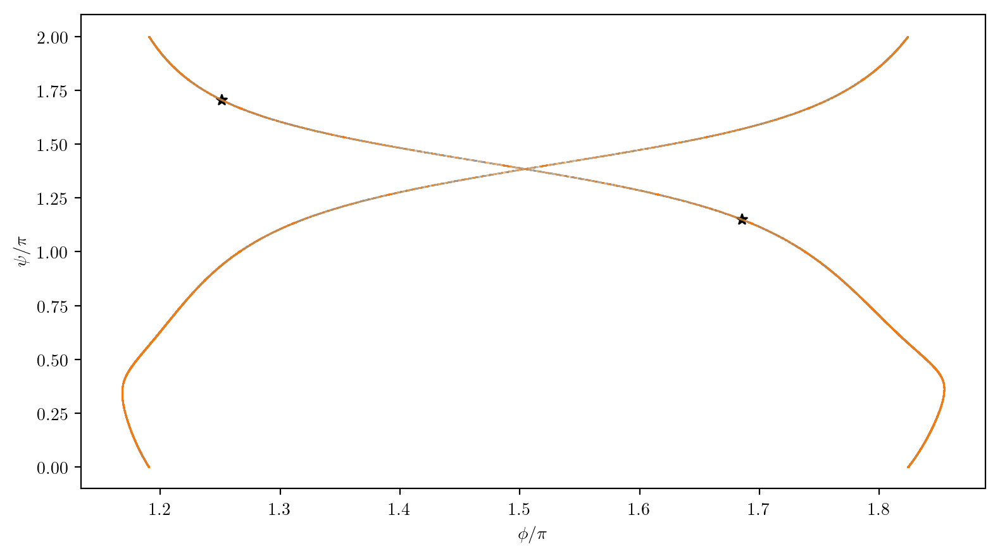

In [54]:
Table_t_range1 = np.array((9000, np.inf))
Table_t_range2 = np.array((9000, np.inf))
nshow = np.inf
# nshow = 2
fast_mode2 = True
figsize = np.array((16, 9)) * 0.5
dpi = 200

i0 = 3
iidx = np.where(np.isclose(type_fre2.values, i0))
spf_tb.phase_map_show_idx_list(type_fre2, iidx, job_dir, nshow=nshow, figsize=figsize, dpi=dpi, 
                               Table_t_range1=Table_t_range1, Table_t_range2=Table_t_range2, fast_mode=fast_mode2, )

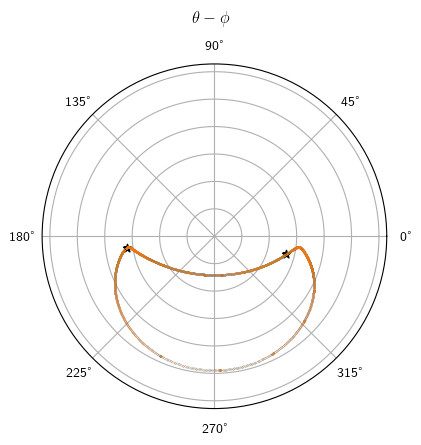

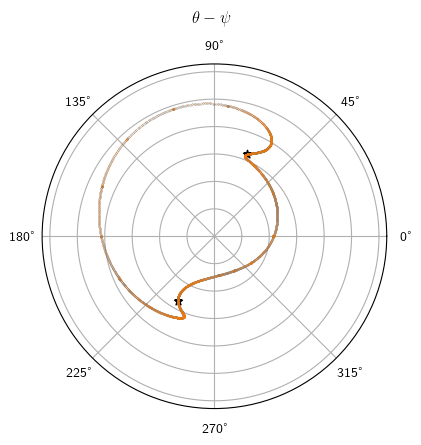

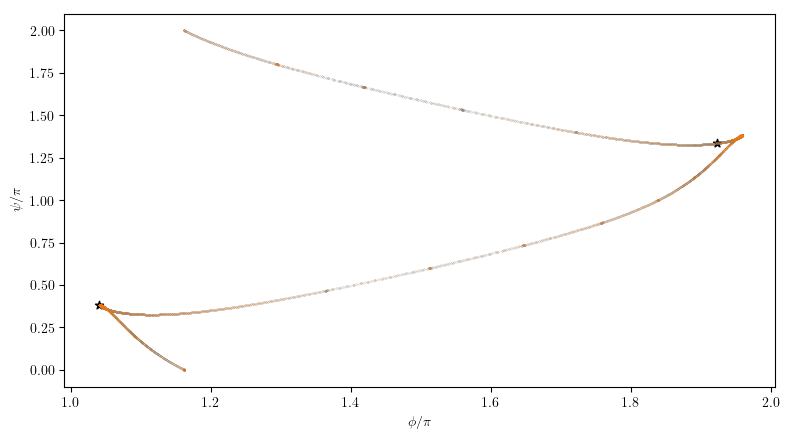

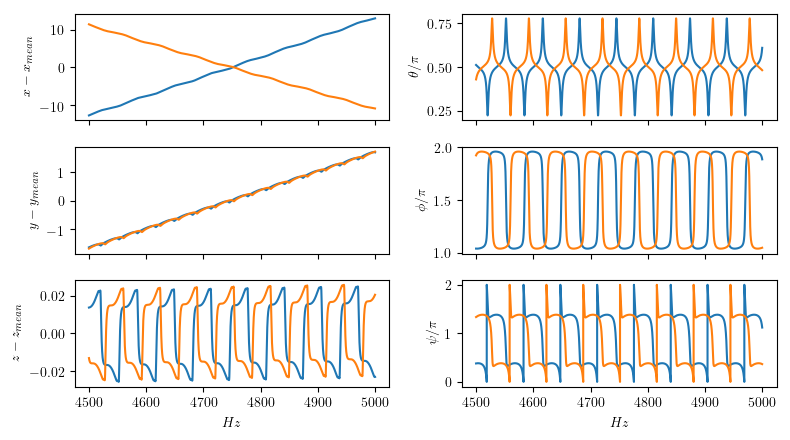

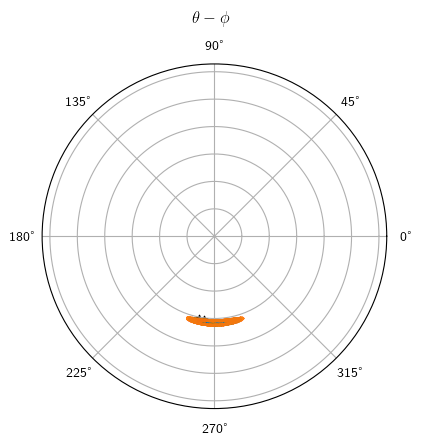

...

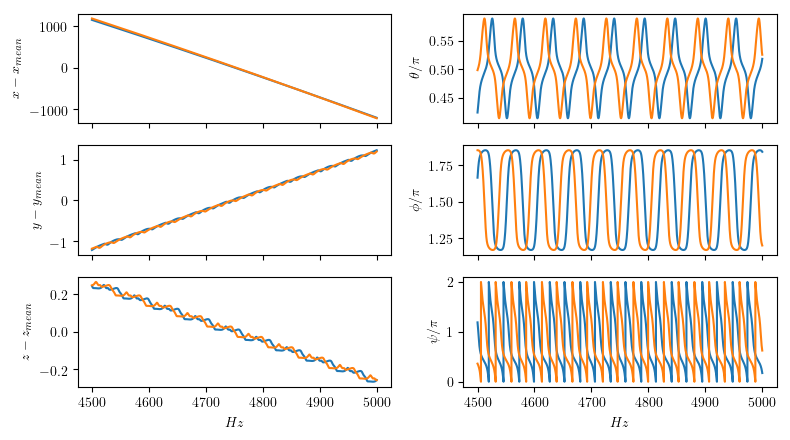

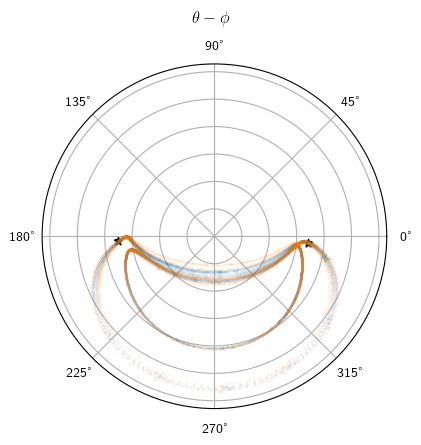

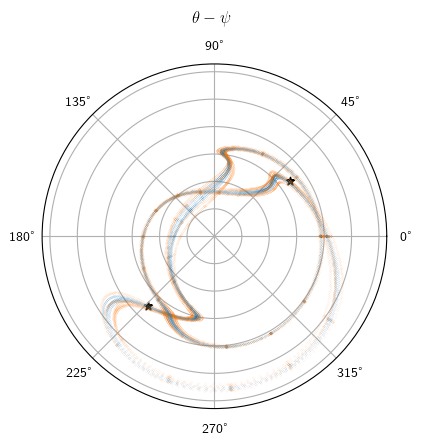

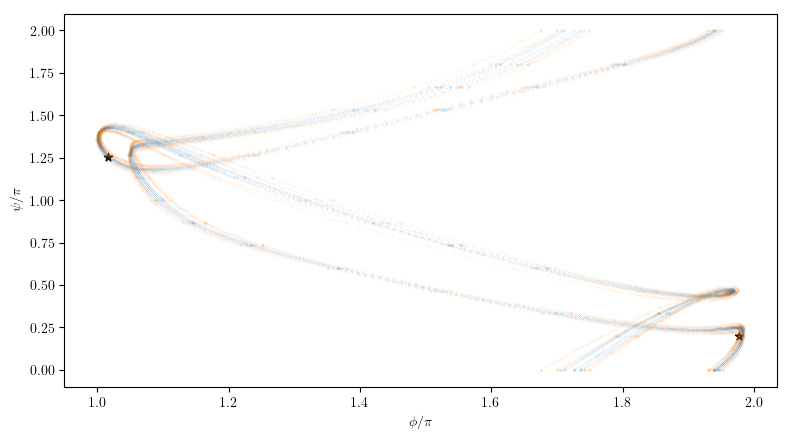

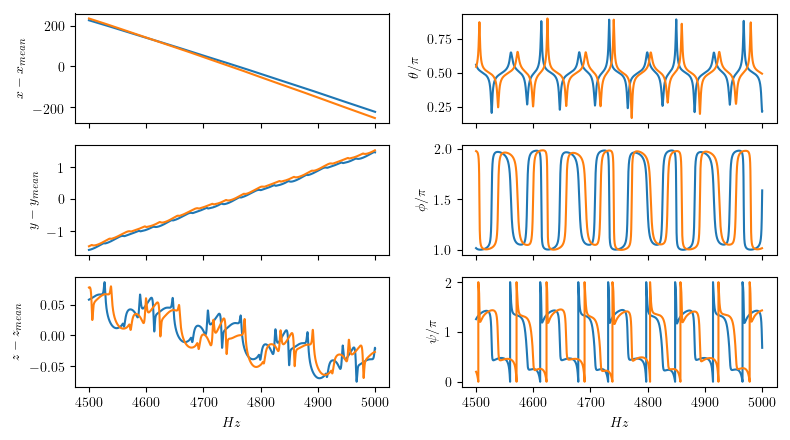

In [48]:
Table_t_range1 = np.array((4500, 6000))
Table_t_range2 = np.array((4500, 6000))
nshow = np.inf
# nshow = 2
fast_mode2 = True
figsize = np.array((16, 9)) * 0.5
dpi = 100

for i0 in np.arange(type_fre2.values.max() + 1)[:]:
    iidx = np.where(np.isclose(type_fre2.values, i0))
    spf_tb.phase_map_show_idx_list(type_fre2, iidx, job_dir, nshow=nshow, figsize=figsize, dpi=dpi, 
                                   Table_t_range1=Table_t_range1, Table_t_range2=Table_t_range2, fast_mode=fast_mode2, )

In [33]:
# for i0 in np.arange(type_fre2.values.max() + 1)[:]:
i0 = 2
Table_t_range = (4500, np.inf)

iidx = np.where(np.isclose(type_fre2.values, i0))
theta = type_fre.index.values[iidx[0]]
phi = type_fre.columns.values[iidx[1]]
theta_phi_list = np.vstack((theta, phi)).T

t1 = []
for theta, phi in theta_phi_list:
    tpick, _ = spf_tb.load_table_date_pickle(job_dir, theta, phi)
    Table_t = tpick['Table_t']
    idx = np.logical_and(Table_t >= Table_t_range[0], Table_t <= Table_t_range[1])
    Table_theta = tpick['Table_theta'][idx]
    Table_phi = tpick['Table_phi'][idx]
    Table_psi = tpick['Table_psi'][idx]
    t2 = (np.max(Table_theta), np.min(Table_theta), np.mean(Table_theta), 
          np.max(Table_phi), np.min(Table_phi), np.mean(Table_phi), 
          np.max(Table_psi), np.min(Table_psi), np.mean(Table_psi), )
    t1.append(t2)

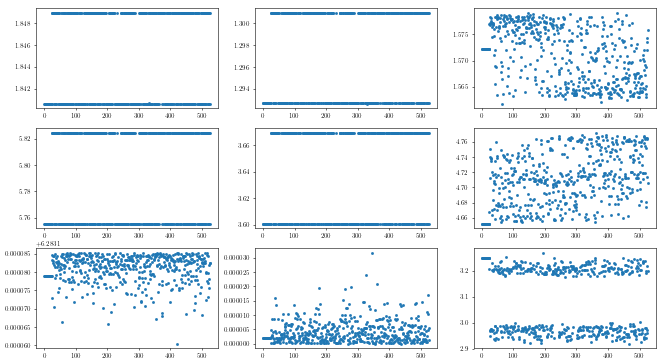

In [35]:
figsize = np.array((16, 9))
dpi = 50

t1 = np.vstack(t1)
t1[t1[:, 0] > 1.9, :] = np.nan 
fig, axs = plt.subplots(3, 3, figsize=figsize, dpi=dpi)
for i0, axi in enumerate(axs.ravel()):
    axi.plot(t1[:, i0], '.')

True

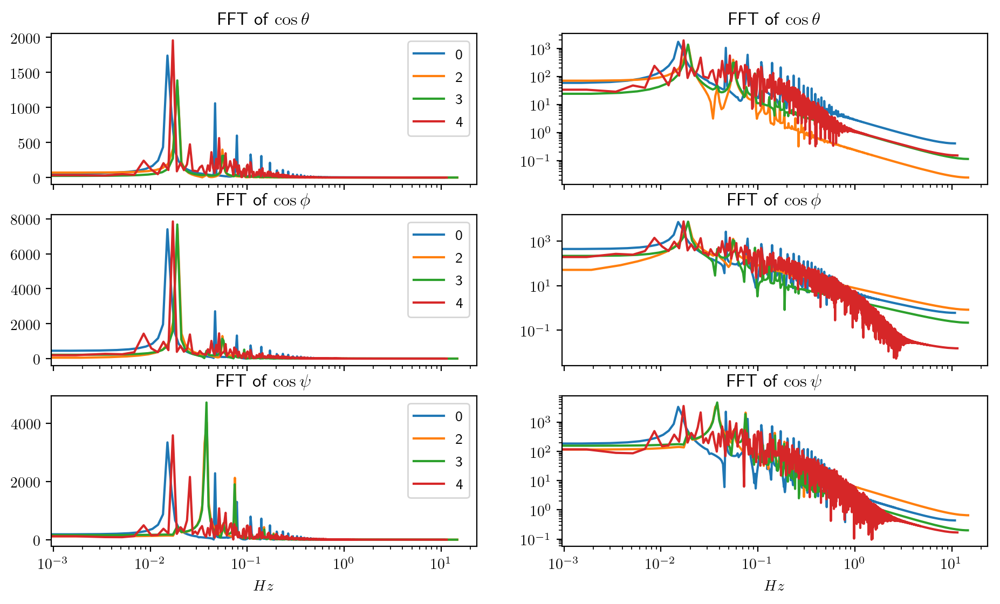

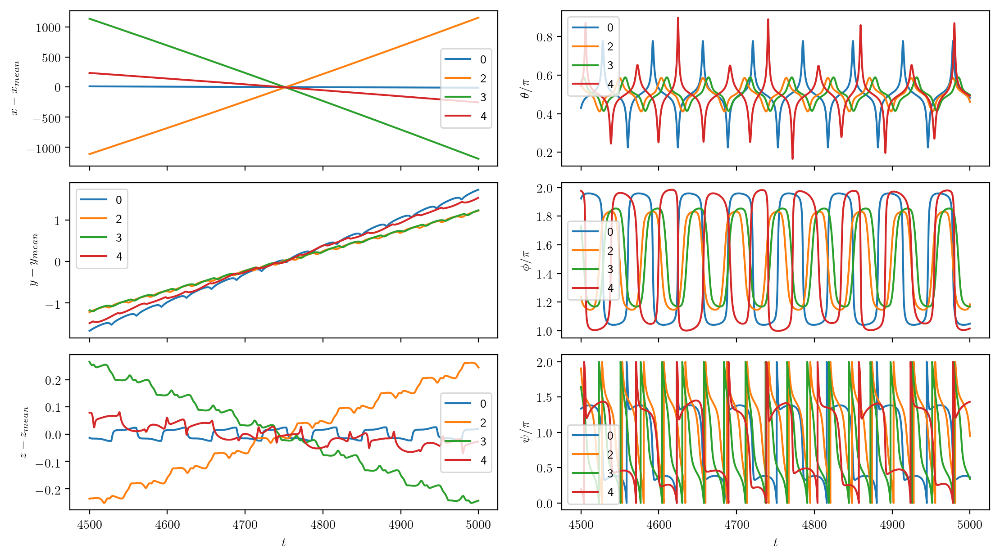

In [5]:
tipical_th_ph_list = [[0.   , 1.714],
                      [0.000, 0.   ],
                      [0.000, 0.   ],
                      [0.143, 0.143],
                      [1.999, 6.140]]

tipical_th_ph_use_idx = [0, 2, 3, 4, ]
Table_t_range = np.array((4500, np.inf))
figsize = np.array((16, 9)) * 0.7
dpi = 200

tipical_th_ph_list_use = np.array(tipical_th_ph_list)[tipical_th_ph_use_idx]
label_list = np.arange(len(tipical_th_ph_list))[tipical_th_ph_use_idx]
spf_tb.show_table_theta_phi_psi_fft_list(tipical_th_ph_list_use, job_dir, label_list=label_list, figsize=figsize, dpi=dpi, 
                                         use_welch=False)
spf_tb.show_table_theta_phi_psi_fft_list(tipical_th_ph_list_use, job_dir, label_list=label_list, figsize=figsize, dpi=dpi, 
                                         use_welch=True)
spf_tb.show_table_result_list(tipical_th_ph_list_use, job_dir, label_list=label_list, Table_t_range=Table_t_range,
                              figsize=figsize, dpi=dpi)

In [59]:
psi_lim_fct = 20
resampling_fct = 10
figsize = np.array((16, 9)) * 0.7
dpi = 200

# case_path_list = separate_fre_path_v2(type_fre2)
# color_list =     [np.array(plt.get_cmap('tab20', len(check_fre_list))(i0)[:3]).reshape((1, 3)) 
#                   for i0 in np.arange(type_fre2.values.max() + 1)]
for idx, psi_lim1 in enumerate(np.linspace(0, 2 * np.pi, psi_lim_fct * 16, endpoint=False)[::psi_lim_fct]):
    psi_lim = (psi_lim1, psi_lim1 + 2 * np.pi / (psi_lim_fct * 16))
    # create fig
    desc = '$\\psi \\in [%.3f \\pi, %.3f \\pi)$' % ((psi_lim[0] / np.pi), (psi_lim[1] / np.pi))
    fig, ax1 = plt.subplots(1, 1, figsize=figsize, dpi=dpi, subplot_kw=dict(polar=True))
    n_xticks = 32
    xticks = np.arange(n_xticks)
    ax1.set_xticks(xticks / n_xticks * 2 * np.pi)
    ax1.set_xticklabels(['$\dfrac{%d}{%d}2\pi$' % (i0, n_xticks) for i0 in xticks])
    ax1.set_yticklabels([])
    ax1.set_ylim(0, np.pi)
    fig.suptitle(desc)
    fig.tight_layout(rect=[0, 0, 1, 0.95])
    
    for i0 in np.arange(type_fre2.values.max() + 1):
        # get case_path
        iidx = np.where(np.isclose(type_fre2.values, i0))
        theta = type_fre2.index.values[iidx[0]]
        phi = type_fre2.columns.values[iidx[1]]
        theta_phi_list = np.vstack((theta, phi)).T
        case_path = []
        for theta, phi in theta_phi_list[:]:
            t_headle = 'th%5.3f_ph%5.3f_(.*?).pickle' % (theta, phi)
            filename = [filename for filename in os.listdir(job_dir)
                        if re.match(t_headle, filename) is not None][0]
            case_path.append(os.path.join(PWD, job_dir, filename))
            
        thandle = ''
        color = np.array(plt.get_cmap('tab20', int(type_fre2.values.max() + 1))(int(i0))[:3]).reshape((1, 3)) 
#         print(int(type_fre2.values.max()), i0, color)
        spf_tb.draw_phase_map_theta(case_path, color, psi_lim, axs=[ax1, ], thandle=thandle, 
                                    resampling=True, resampling_fct=resampling_fct)
    tdir = os.path.join(PWD, job_dir, 'phase_mape_fre')
    if not os.path.exists(tdir):
        os.makedirs(tdir)
    figname = os.path.join(tdir, '%04d.png' % (idx))
    fig.savefig(os.path.join(tdir, figname))
    print('save to %s' % figname)
    plt.close(fig)


save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.1_psi-0a/phase_mape_fre/0000.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.1_psi-0a/phase_mape_fre/0001.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.1_psi-0a/phase_mape_fre/0002.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.1_psi-0a/phase_mape_fre/0003.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.1_psi-0a/phase_mape_fre/0004.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.1_psi-0a/phase_mape_fre/0005.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.1_psi-0a/phase_mape_fre/0006.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.1_psi-0a/phase_mape_fre/0007.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.1_psi-0a/phase_mape_fre/0008.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.1_psi-0a/phase_mape_fre/0009.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.1_psi-0a/phase_mape_fre/0010.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.1_psi-0a/phase_mape_fre/0011.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.1_psi-0a/phase_mape_fre/0012.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.1_psi-0a/phase_mape_fre/0013.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.1_psi-0a/phase_mape_fre/0014.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_wt0.1_psi-0a/phase_mape_fre/0015.png
